In [1]:
import numpy as np
import IPython.display as ipd
from scipy.io import wavfile
import librosa
import librosa.display as display
import matplotlib.pyplot as plt
import scipy

/home/faber6911/anaconda3/envs/kalditorch/lib/python3.8/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit
/home/faber6911/anaconda3/envs/kalditorch/lib/python3.8/site-packages/librosa/util/decorators.py:9: NumbaDeprecationWarning: An import was requested from a module that has moved location.
Import of 'jit' requested from: 'numba.decorators', please update to use 'numba.core.decorators' or pin to Numba version 0.48.0. This alias will not be present in Numba version 0.50.0.
  from numba.decorators import jit as optional_jit


In [2]:
for count, line in enumerate(open('../data/clean_wav.scp')):
    utt, clean_path = line.rstrip().split()
    if count == 9000:
        break
    
for count, line in enumerate(open('../data/noise_wav.scp')):
    utt, noise_path = line.rstrip().split()
    if count == 1:
        break

In [3]:
clean_audio, sr = librosa.load(clean_path, sr = 16000)
noise_audio, sr1 = librosa.load(noise_path, sr = 16000)

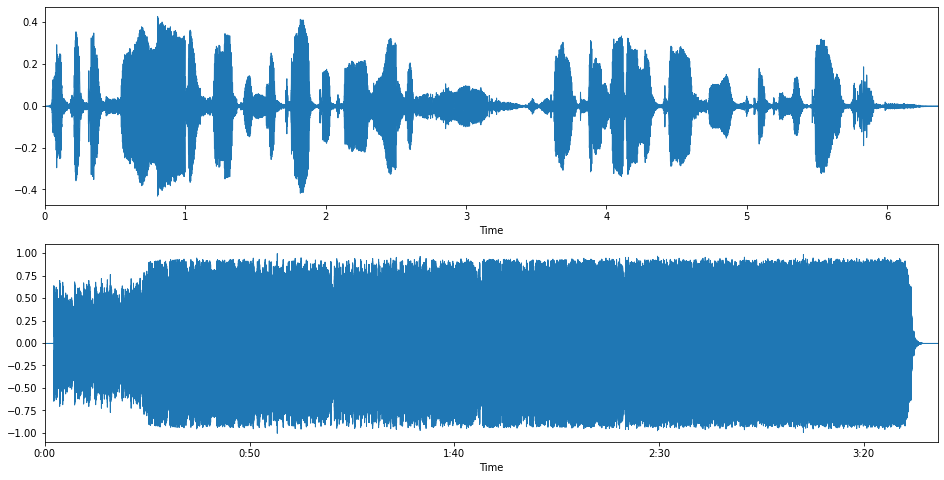

In [4]:
plt.figure(figsize = (16, 8))
plt.subplot(2, 1, 1)
display.waveplot(clean_audio.astype('float'), sr)
plt.subplot(2, 1, 2)
display.waveplot(noise_audio.astype('float'), sr1)

In [147]:
ipd.Audio(clean_audio, rate = sr)

In [148]:
ipd.Audio(noise_audio, rate = sr1)

In [5]:
clean_audio.shape, noise_audio.shape, np.abs(clean_audio.shape[0] - noise_audio.shape[0])

((101797,), (3488705,), 3386908)

In [6]:
def read_audio(filepath, sample_rate, normalize=False):
    # print(f"Reading: {filepath}").
    audio, sr = librosa.load(filepath, sr=sample_rate)
    if normalize:
        div_fac = 1 / np.max(np.abs(audio)) / 3.0
        audio = audio * div_fac
    return audio, sr

In [7]:
def add_noise(clean_audio, noise_audio, snr):
    if len(clean_audio) >= len(noise_audio):
        while len(clean_audio) >= len(noise_audio):
            noise_audio = np.append(noise_audio, noise_audio)
    
    # Adjust noise length
    ind = np.random.randint(0, noise_audio.size - clean_audio.size)
    noiseSegment = noise_audio[ind:ind+clean_audio.size]
    
    # Signal Noise Ratio
    RMSspeech = np.sqrt(np.mean(clean_audio**2))
    RMSnoise = np.sqrt(np.mean(noiseSegment**2))
    a = float(snr) / 20
    adjustedRMSnoise = RMSspeech / (10**a)
    
    # Noisy audio signal
    noisyAudio = clean_audio + noiseSegment*(adjustedRMSnoise/RMSnoise) 
    
    return noisyAudio

In [10]:
import random

In [22]:
random.choice([1.5, 3.5, 7., 17.5])

17.5

In [8]:
new_audio = add_noise(clean_audio, noise_audio, snr = 1.5)

In [9]:
ipd.Audio(new_audio, rate = 16000)

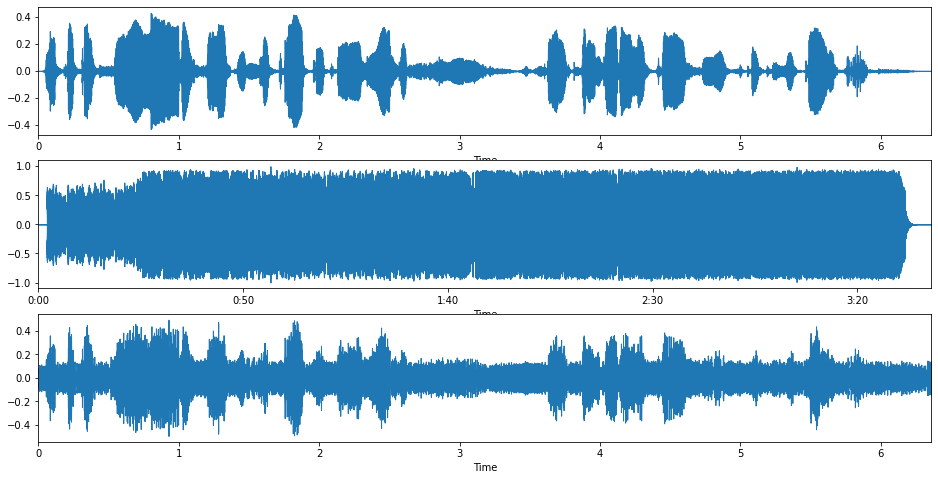

In [154]:
plt.figure(figsize = (16, 8))
plt.subplot(3, 1, 1)
display.waveplot(clean_audio, sr)
plt.subplot(3, 1, 2)
display.waveplot(noise_audio, sr)
plt.subplot(3, 1, 3)
display.waveplot(new_audio, sr)